In [1]:
import pandas as pd
import numpy as np
import requests
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
from sklearn.metrics import r2_score
from sklearn.cluster import KMeans
import statsmodels.api as sm
from colorama import Fore, Style
from scipy.optimize import fsolve, curve_fit
import yfinance as yf
import akshare as ak
import sys
sys.path.append('../src') 
from utils import plot_candlestick, get_optimum_clusters, exponential_func

from chinese_etf_strategy import etf_strategy, etf_regression
from chinese_commodity_strategy import commodity_strategy

## Some sample code that're working

In [2]:
# Tongxin ETF, changnei, history
etf_code = "sh515880"  # ETF代码
etf_hist = ak.fund_etf_hist_sina(symbol=etf_code)
etf_hist.tail()

,date,open,high,low,close,volume
1433,2025-08-07,1.775,1.799,1.723,1.762,220658518
1434,2025-08-08,1.754,1.790,1.747,1.764,169367900
1435,2025-08-11,1.767,1.817,1.764,1.801,181816016
1436,2025-08-12,1.803,1.865,1.799,1.861,230028557
1437,2025-08-13,1.867,1.987,1.850,1.981,532398896


In [3]:
# Tongxin ETF, changnei, realtime
df = ak.fund_etf_spot_ths()
df[df['基金代码']=='515880']

,序号,基金代码,基金名称,当前-单位净值,当前-累计净值,前一日-单位净值,前一日-累计净值,增长值,增长率,赎回状态,申购状态,最新-交易日,最新-单位净值,最新-累计净值,基金类型,查询日期
0,1,515880,国泰中证全指通信设备ETF,1.9798,1.9798,1.8573,1.8573,0.1225,6.6,开放,开放,2025-08-13,1.9798,1.9798,股票型,2025-08-13


In [4]:
# Tongxin ETF, changnei, lishi and shishi
etf_code = "515880"  # ETF代码
start_date = (datetime.today() - relativedelta(years=3)).strftime('%Y%m%d')   # 开始日期
end_date = datetime.today().strftime('%Y%m%d')  # 结束日期

etf_hist = ak.fund_etf_hist_em(symbol=etf_code, period="daily", start_date=start_date, end_date=end_date, adjust="")
etf_hist.rename(columns={"日期": 'date', "开盘": 'open', "收盘": 'close', "最高": 'high', "最低": 'low', "成交量": 'volume', "成交额": 'amount'}, inplace=True)
etf_hist.tail()

  0%|          | 0/12 [00:00<?, ?it/s]

,date,open,close,high,low,volume,amount,振幅,涨跌幅,涨跌额,换手率
722,2025-08-07,1.775,1.762,1.799,1.723,2206585,3.893330e+08,4.30,-0.34,-0.006,10.92
723,2025-08-08,1.754,1.764,1.790,1.747,1693679,2.999749e+08,2.44,0.11,0.002,8.38
724,2025-08-11,1.767,1.801,1.817,1.764,1818160,3.267348e+08,3.00,2.10,0.037,9.00
725,2025-08-12,1.803,1.861,1.865,1.799,2300286,4.233251e+08,3.66,3.33,0.060,11.38
726,2025-08-13,1.867,1.981,1.987,1.850,5323989,1.036458e+09,7.36,6.45,0.120,26.35


In [5]:
# Huangjin, history
spot_hist_sge_df = ak.spot_hist_sge(symbol='Au99.99')
spot_hist_sge_df['date']= pd.to_datetime(spot_hist_sge_df['date'])
spot_hist_sge_df.tail()

,date,open,close,low,high
2095,2025-08-07,780.9,782.08,779.01,782.50
2096,2025-08-08,779.5,783.18,779.50,784.50
2097,2025-08-11,783.0,775.54,775.01,790.00
2098,2025-08-12,775.0,773.47,772.00,775.00
2099,2025-08-13,773.0,774.96,771.00,775.48


In [6]:
last_49day_price = spot_hist_sge_df['close'][-50:-1]
p_ma = np.mean(last_49day_price)
print('50MA break point:', round(p_ma,2))

50MA break point: 774.98


In [7]:
# Huangjin, realtime
spot_quotations_sge_df = ak.spot_quotations_sge(symbol="Au99.99")
spot_quotations_sge_df[spot_quotations_sge_df['时间'] == spot_quotations_sge_df['时间'].max()]

,品种,时间,现价,更新时间
273,Au99.99,11:02:00,772.0,2025年08月14日 11:02:55


In [8]:
spot_quotations_sge_df[spot_quotations_sge_df['时间'] == spot_quotations_sge_df['时间'].max()]['现价']

273    772.0
Name: 现价, dtype: float64

## ALL ETFs

* Current etf price: 0.79
* Recent high: 0.9
* Current etf price is at 88.41% of recent high
Latest 20 Day MA: 0.78
Latest lower Bollinger Band, 20MA: 0.74
Latest higher Bollinger Band, 20MA: 0.81
Latest 50 Day MA: 0.75
Latest lower Bollinger Band, 50MA: 0.68
Latest higher Bollinger Band, 50MA: 0.81
Latest 50 Day EMA: 0.75
Latest 120 Day MA: 0.73
Latest 200 Day MA: 0.74
Latest 200 Day EMA: 0.74

Latest RSI: 54.76 
Latest MACD Divergence: -0.0 
50MA crosses 200MA at 0.21
20MA break point: 0.78
20MA lower Bollinger Band break point: 0.75
20MA Upper Bollinger Band break point: 0.81
50MA break point: 0.75
50MA lower Bollinger Band break point: 0.67
50MA Upper Bollinger Band break point: 0.82
120MA break point: 0.73
200MA break point: 0.74


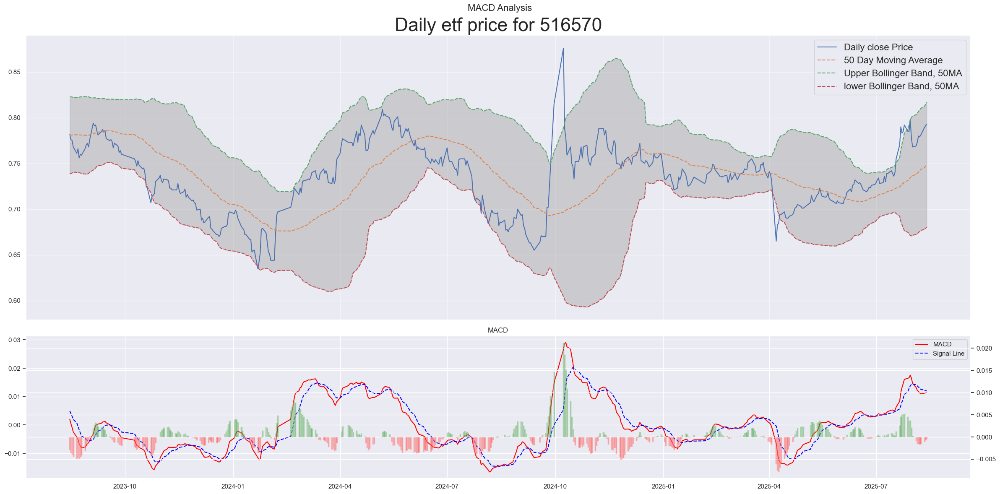

In [9]:
# 石油石化
etf_code = "516570"
etf_strategy(etf_code).output()

* Current etf price: 1.5
* Recent high: 1.6
* Current etf price is at 94.06% of recent high
Latest 20 Day MA: 1.52
Latest lower Bollinger Band, 20MA: 1.48
Latest higher Bollinger Band, 20MA: 1.56
Latest 50 Day MA: 1.51
Latest lower Bollinger Band, 50MA: 1.41
Latest higher Bollinger Band, 50MA: 1.61
Latest 50 Day EMA: 1.5
Latest 120 Day MA: 1.42
Latest 200 Day MA: 1.35
Latest 200 Day EMA: 1.36

Latest RSI: 44.85 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 1.36
20MA break point: 1.52
20MA lower Bollinger Band break point: 1.48
20MA Upper Bollinger Band break point: 1.56
50MA break point: 1.51
50MA lower Bollinger Band break point: 1.4
50MA Upper Bollinger Band break point: 1.62
120MA break point: 1.42
200MA break point: 1.35


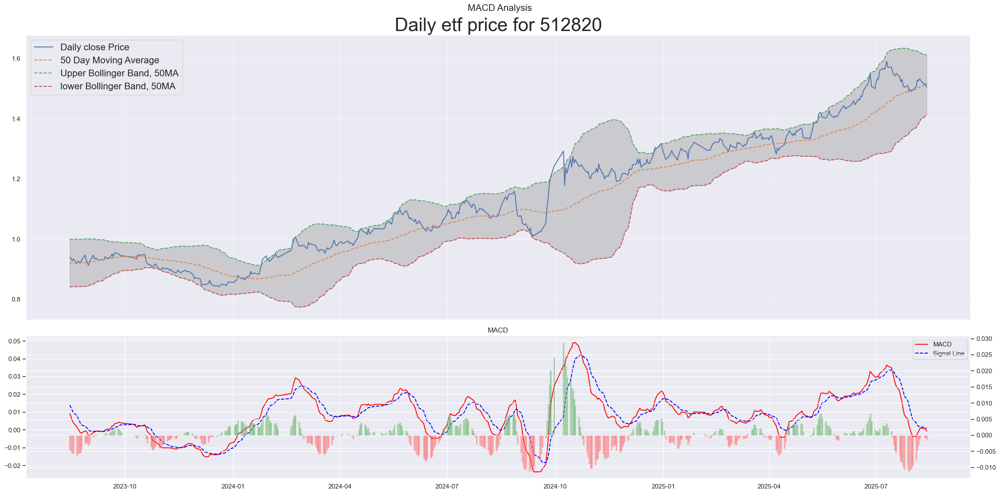

In [10]:
# 中证银行
etf_code = "512820"
etf_strategy(etf_code).output()

* Current etf price: 1.68
* Recent high: 1.76
* Current etf price is at 95.50999999999999% of recent high
Latest 20 Day MA: 1.65
Latest lower Bollinger Band, 20MA: 1.6
Latest higher Bollinger Band, 20MA: 1.69
Latest 50 Day MA: 1.59
Latest lower Bollinger Band, 50MA: 1.46
Latest higher Bollinger Band, 50MA: 1.72
Latest 50 Day EMA: 1.61
Latest 120 Day MA: 1.57
Latest 200 Day MA: 1.57
Latest 200 Day EMA: 1.55

Latest RSI: 55.2 
Latest MACD Divergence: -0.0 
50MA crosses 200MA at 0.42
20MA break point: 1.65
20MA lower Bollinger Band break point: 1.6
20MA Upper Bollinger Band break point: 1.69
50MA break point: 1.59
50MA lower Bollinger Band break point: 1.45
50MA Upper Bollinger Band break point: 1.73
120MA break point: 1.57
200MA break point: 1.57


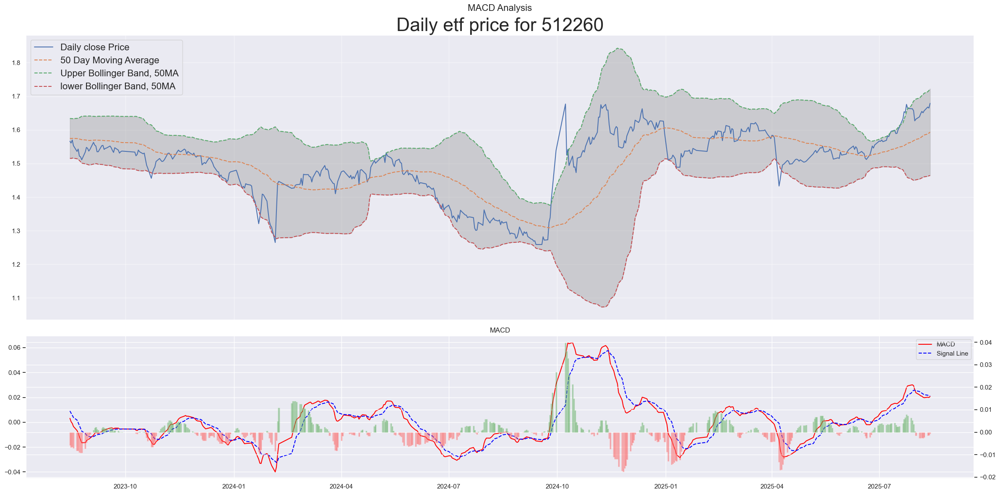

In [11]:
# 500低波
etf_code = "512260"
etf_strategy(etf_code).output()

* Current etf price: 1.12
* Recent high: 1.18
* Current etf price is at 95.09% of recent high
Latest 20 Day MA: 1.07
Latest lower Bollinger Band, 20MA: 1.02
Latest higher Bollinger Band, 20MA: 1.12
Latest 50 Day MA: 1.04
Latest lower Bollinger Band, 50MA: 0.96
Latest higher Bollinger Band, 50MA: 1.12
Latest 50 Day EMA: 1.05
Latest 120 Day MA: 1.05
Latest 200 Day MA: 1.04
Latest 200 Day EMA: 1.0

Latest RSI: 69.49 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.01
50MA crosses 200MA at 0.93
20MA break point: 1.07
20MA lower Bollinger Band break point: 1.01
20MA Upper Bollinger Band break point: 1.13
50MA break point: 1.04
50MA lower Bollinger Band break point: 0.95
50MA Upper Bollinger Band break point: 1.13
120MA break point: 1.05
200MA break point: 1.04


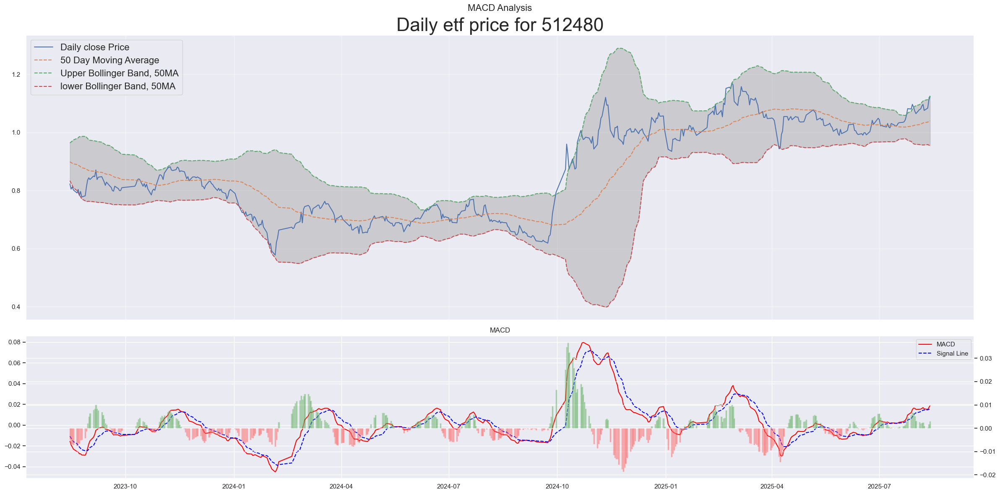

In [12]:
# 半导体
etf_code = "512480"
etf_strategy(etf_code).output()

* Current etf price: 1.0
* Recent high: 1.19
* Current etf price is at 84.19% of recent high
Latest 20 Day MA: 0.99
Latest lower Bollinger Band, 20MA: 0.96
Latest higher Bollinger Band, 20MA: 1.02
Latest 50 Day MA: 0.95
Latest lower Bollinger Band, 50MA: 0.87
Latest higher Bollinger Band, 50MA: 1.04
Latest 50 Day EMA: 0.96
Latest 120 Day MA: 0.94
Latest 200 Day MA: 0.97
Latest 200 Day EMA: 0.95

Latest RSI: 46.96 
Latest MACD Divergence: -0.0 
50MA crosses 200MA at 1.74
20MA break point: 0.99
20MA lower Bollinger Band break point: 0.96
20MA Upper Bollinger Band break point: 1.02
50MA break point: 0.95
50MA lower Bollinger Band break point: 0.86
50MA Upper Bollinger Band break point: 1.05
120MA break point: 0.94
200MA break point: 0.97


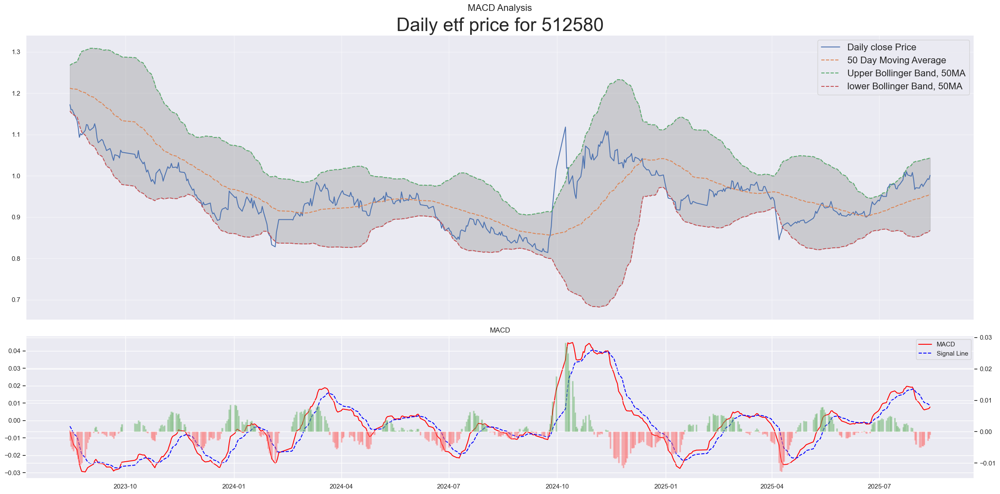

In [13]:
# 环保
etf_code = "512580"
etf_strategy(etf_code).output()

* Current etf price: 2.75
* Recent high: 3.02
* Current etf price is at 91.08000000000001% of recent high
Latest 20 Day MA: 2.57
Latest lower Bollinger Band, 20MA: 2.47
Latest higher Bollinger Band, 20MA: 2.67
Latest 50 Day MA: 2.42
Latest lower Bollinger Band, 50MA: 2.06
Latest higher Bollinger Band, 50MA: 2.77
Latest 50 Day EMA: 2.45
Latest 120 Day MA: 2.33
Latest 200 Day MA: 2.35
Latest 200 Day EMA: 2.3

Latest RSI: 65.08 
Latest MACD Divergence: -0.0 
20MA break point: 2.58
20MA lower Bollinger Band break point: 2.48
20MA Upper Bollinger Band break point: 2.67
50MA break point: 2.42
50MA lower Bollinger Band break point: 2.04
50MA Upper Bollinger Band break point: 2.8
120MA break point: 2.33
200MA break point: 2.35


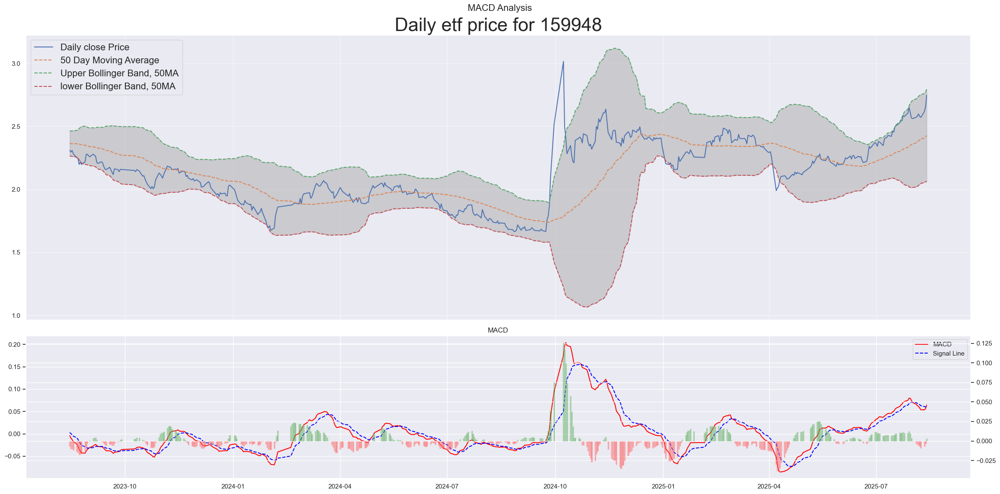

In [14]:
# 创业板
etf_code = "159948"
etf_strategy(etf_code).output()

* Current etf price: 1.14
* Recent high: 1.15
* Current etf price is at 99.83% of recent high
Latest 20 Day MA: 1.05
Latest lower Bollinger Band, 20MA: 1.0
Latest higher Bollinger Band, 20MA: 1.1
Latest 50 Day MA: 0.98
Latest lower Bollinger Band, 50MA: 0.83
Latest higher Bollinger Band, 50MA: 1.13
Latest 50 Day EMA: 1.0
Latest 120 Day MA: 0.97
Latest 200 Day MA: 0.95
Latest 200 Day EMA: 0.93

Latest RSI: 73.94 
Latest MACD Divergence: 0.0 
20MA break point: 1.05
20MA lower Bollinger Band break point: 0.99
20MA Upper Bollinger Band break point: 1.11
50MA break point: 0.98
50MA lower Bollinger Band break point: 0.82
50MA Upper Bollinger Band break point: 1.15
120MA break point: 0.96
200MA break point: 0.95


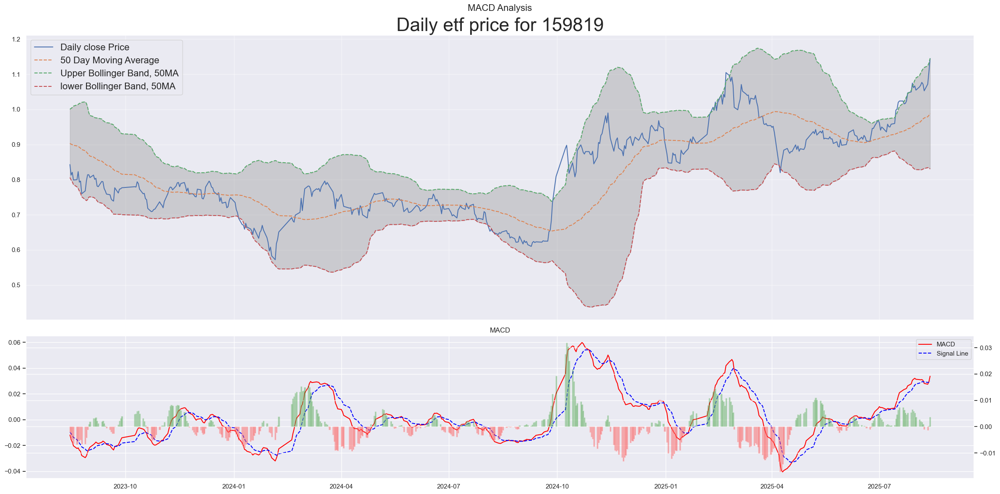

In [15]:
# 人工智能
etf_code = "159819"
etf_strategy(etf_code).output()

* Current etf price: 0.7
* Recent high: 1.01
* Current etf price is at 68.97% of recent high
Latest 20 Day MA: 0.7
Latest lower Bollinger Band, 20MA: 0.68
Latest higher Bollinger Band, 20MA: 0.71
Latest 50 Day MA: 0.69
Latest lower Bollinger Band, 50MA: 0.66
Latest higher Bollinger Band, 50MA: 0.72
Latest 50 Day EMA: 0.69
Latest 120 Day MA: 0.69
Latest 200 Day MA: 0.69
Latest 200 Day EMA: 0.69

Latest RSI: 42.86 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.39
50MA crosses 200MA at 1.03
20MA break point: 0.7
20MA lower Bollinger Band break point: 0.68
20MA Upper Bollinger Band break point: 0.71
50MA break point: 0.69
50MA lower Bollinger Band break point: 0.66
50MA Upper Bollinger Band break point: 0.72
120MA break point: 0.69
200MA break point: 0.69


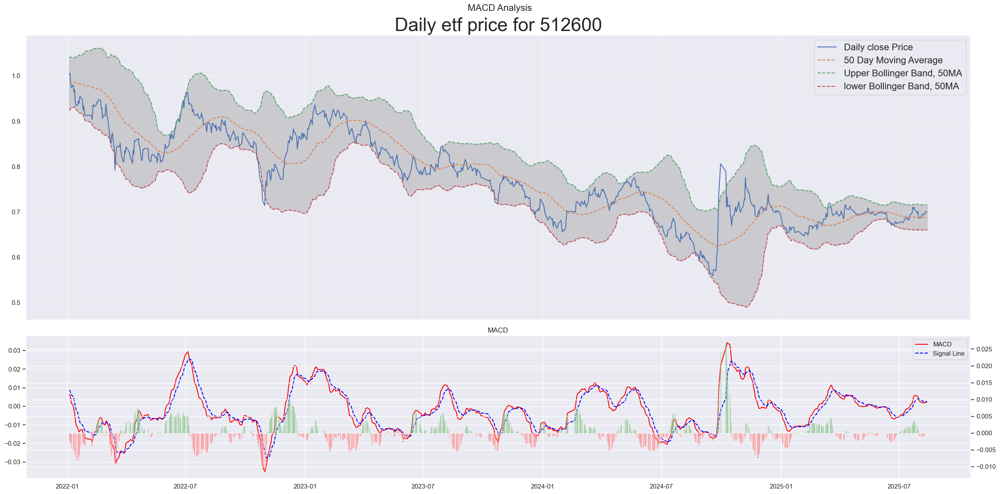

In [16]:
# 必选消费
etf_code = "512600"
etf_strategy(etf_code, start='20210101').output()

* Current etf price: 1.5
* Recent high: 1.51
* Current etf price is at 99.87% of recent high
Latest 20 Day MA: 1.46
Latest lower Bollinger Band, 20MA: 1.42
Latest higher Bollinger Band, 20MA: 1.49
Latest 50 Day MA: 1.41
Latest lower Bollinger Band, 50MA: 1.31
Latest higher Bollinger Band, 50MA: 1.51
Latest 50 Day EMA: 1.43
Latest 120 Day MA: 1.41
Latest 200 Day MA: 1.4
Latest 200 Day EMA: 1.37

Latest RSI: 64.35 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.03
50MA crosses 200MA at 0.67
20MA break point: 1.46
20MA lower Bollinger Band break point: 1.42
20MA Upper Bollinger Band break point: 1.49
50MA break point: 1.41
50MA lower Bollinger Band break point: 1.3
50MA Upper Bollinger Band break point: 1.52
120MA break point: 1.41
200MA break point: 1.4


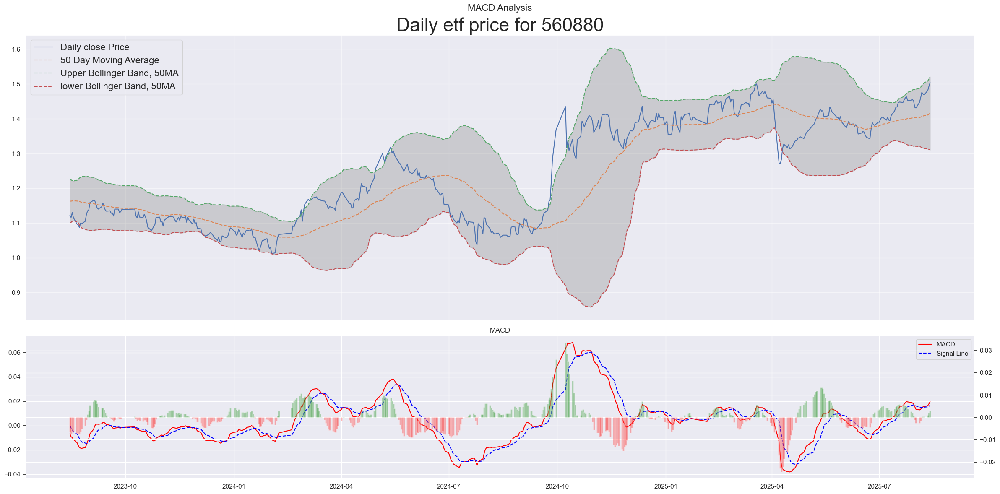

In [17]:
# 家电
etf_code = "560880"
etf_strategy(etf_code).output()

* Current etf price: 1.33
* Recent high: 1.33
* Current etf price is at 100.0% of recent high
Latest 20 Day MA: 1.25
Latest lower Bollinger Band, 20MA: 1.16
Latest higher Bollinger Band, 20MA: 1.34
Latest 50 Day MA: 1.17
Latest lower Bollinger Band, 50MA: 0.99
Latest higher Bollinger Band, 50MA: 1.36
Latest 50 Day EMA: 1.19
Latest 120 Day MA: 1.1
Latest 200 Day MA: 1.08
Latest 200 Day EMA: 1.09

Latest RSI: 63.54 
Latest MACD Divergence: 0.0 
20MA break point: 1.26
20MA lower Bollinger Band break point: 1.17
20MA Upper Bollinger Band break point: 1.35
50MA break point: 1.18
50MA lower Bollinger Band break point: 0.98
50MA Upper Bollinger Band break point: 1.37
120MA break point: 1.1
200MA break point: 1.08


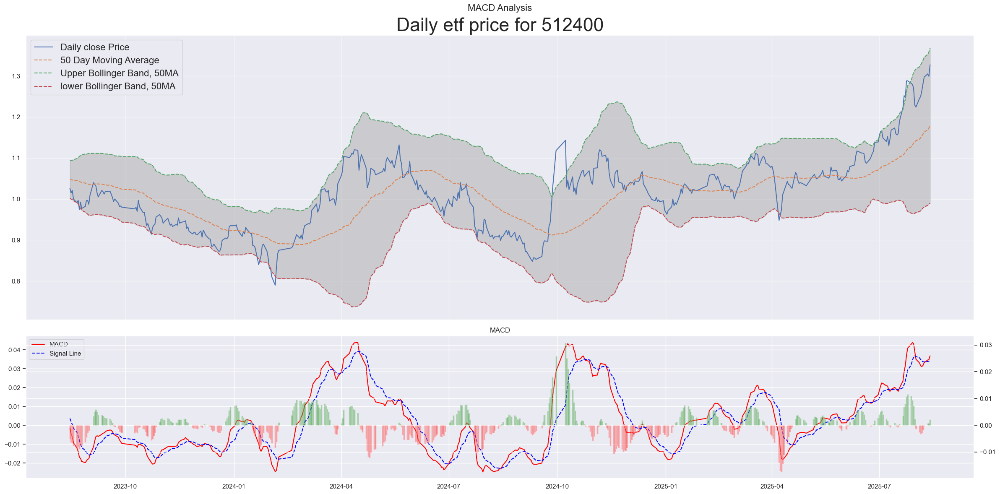

In [18]:
# 有色金属
etf_code = "512400"
etf_strategy(etf_code).output()

* Current etf price: 1.04
* Recent high: 1.2
* Current etf price is at 87.13% of recent high
Latest 20 Day MA: 1.03
Latest lower Bollinger Band, 20MA: 1.01
Latest higher Bollinger Band, 20MA: 1.05
Latest 50 Day MA: 1.02
Latest lower Bollinger Band, 50MA: 0.97
Latest higher Bollinger Band, 50MA: 1.06
Latest 50 Day EMA: 1.01
Latest 120 Day MA: 0.99
Latest 200 Day MA: 1.01
Latest 200 Day EMA: 1.0

Latest RSI: 53.7 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.61
50MA crosses 200MA at 0.35
20MA break point: 1.03
20MA lower Bollinger Band break point: 1.01
20MA Upper Bollinger Band break point: 1.05
50MA break point: 1.02
50MA lower Bollinger Band break point: 0.97
50MA Upper Bollinger Band break point: 1.06
120MA break point: 0.99
200MA break point: 1.01


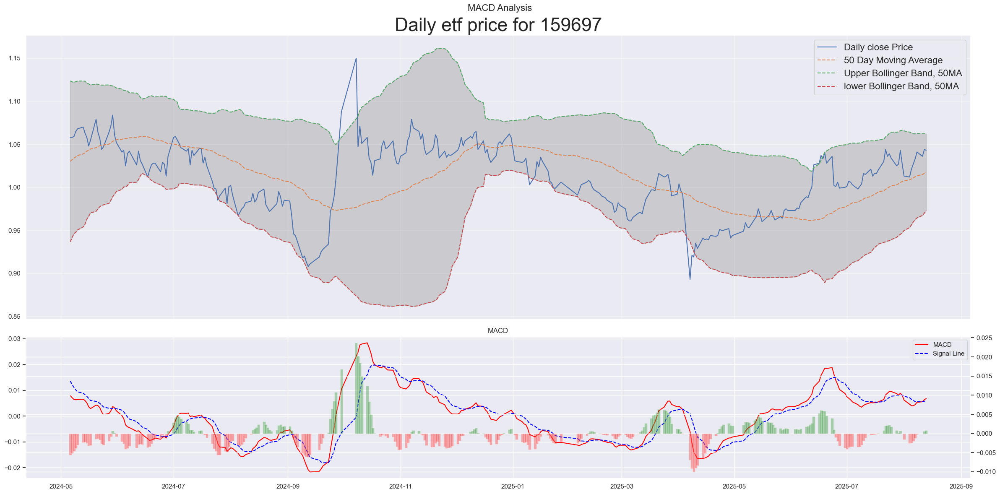

In [19]:
# 油气
etf_code = "159697"
etf_strategy(etf_code).output()

* Current etf price: 1.98
* Recent high: 1.99
* Current etf price is at 99.7% of recent high
Latest 20 Day MA: 1.7
Latest lower Bollinger Band, 20MA: 1.55
Latest higher Bollinger Band, 20MA: 1.86
Latest 50 Day MA: 1.52
Latest lower Bollinger Band, 50MA: 1.09
Latest higher Bollinger Band, 50MA: 1.94
Latest 50 Day EMA: 1.56
Latest 120 Day MA: 1.36
Latest 200 Day MA: 1.37
Latest 200 Day EMA: 1.36

Latest RSI: 89.22 
Latest MACD Divergence: 0.0 
20MA break point: 1.71
20MA lower Bollinger Band break point: 1.54
20MA Upper Bollinger Band break point: 1.88
50MA break point: 1.52
50MA lower Bollinger Band break point: 1.06
50MA Upper Bollinger Band break point: 1.98
120MA break point: 1.36
200MA break point: 1.37


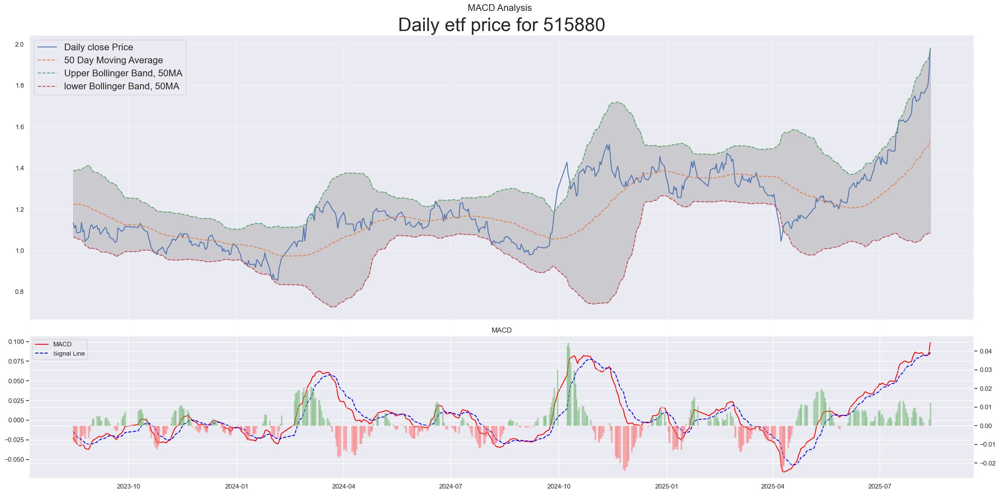

In [20]:
# 通信
etf_code = "515880"
etf_strategy(etf_code).output()

* Current etf price: 0.73
* Recent high: 0.74
* Current etf price is at 97.99% of recent high
Latest 20 Day MA: 0.7
Latest lower Bollinger Band, 20MA: 0.66
Latest higher Bollinger Band, 20MA: 0.74
Latest 50 Day MA: 0.66
Latest lower Bollinger Band, 50MA: 0.56
Latest higher Bollinger Band, 50MA: 0.76
Latest 50 Day EMA: 0.66
Latest 120 Day MA: 0.61
Latest 200 Day MA: 0.58
Latest 200 Day EMA: 0.6

Latest RSI: 63.64 
Latest MACD Divergence: -0.0 
20MA break point: 0.71
20MA lower Bollinger Band break point: 0.67
20MA Upper Bollinger Band break point: 0.75
50MA break point: 0.66
50MA lower Bollinger Band break point: 0.55
50MA Upper Bollinger Band break point: 0.77
120MA break point: 0.61
200MA break point: 0.58


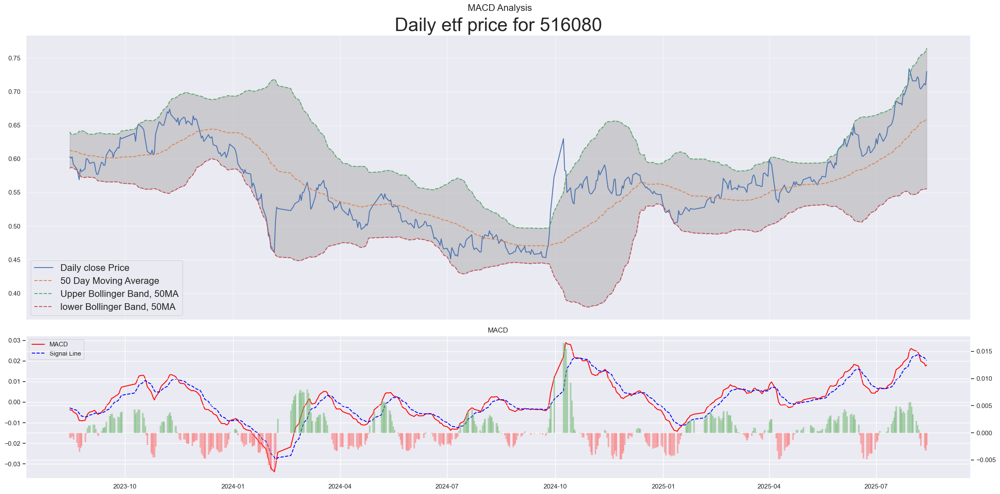

In [21]:
# 创新药
etf_code = "516080"
etf_strategy(etf_code).output()

* Current etf price: 1.04
* Recent high: 1.21
* Current etf price is at 86.72% of recent high
Latest 20 Day MA: 1.03
Latest lower Bollinger Band, 20MA: 0.99
Latest higher Bollinger Band, 20MA: 1.06
Latest 50 Day MA: 1.0
Latest lower Bollinger Band, 50MA: 0.94
Latest higher Bollinger Band, 50MA: 1.07
Latest 50 Day EMA: 1.01
Latest 120 Day MA: 0.98
Latest 200 Day MA: 0.99
Latest 200 Day EMA: 0.99

Latest RSI: 63.3 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.1
50MA crosses 200MA at 0.51
20MA break point: 1.03
20MA lower Bollinger Band break point: 0.99
20MA Upper Bollinger Band break point: 1.07
50MA break point: 1.0
50MA lower Bollinger Band break point: 0.93
50MA Upper Bollinger Band break point: 1.07
120MA break point: 0.98
200MA break point: 0.99


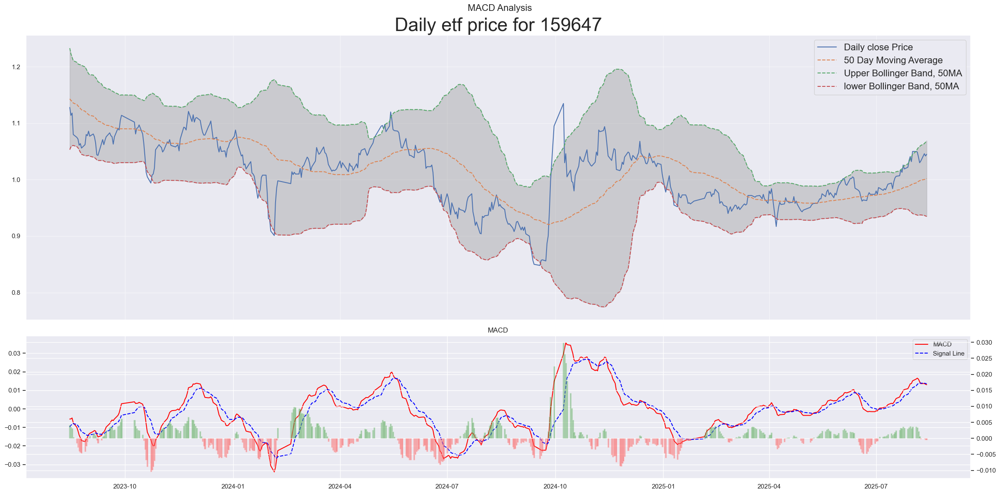

In [22]:
# 中药
etf_code = "159647"
etf_strategy(etf_code).output()

* Current etf price: 1.1
* Recent high: 1.4
* Current etf price is at 78.85% of recent high
Latest 20 Day MA: 1.08
Latest lower Bollinger Band, 20MA: 1.0
Latest higher Bollinger Band, 20MA: 1.16
Latest 50 Day MA: 1.03
Latest lower Bollinger Band, 50MA: 0.91
Latest higher Bollinger Band, 50MA: 1.15
Latest 50 Day EMA: 1.05
Latest 120 Day MA: 1.01
Latest 200 Day MA: 1.06
Latest 200 Day EMA: 1.05

Latest RSI: 50.0 
Latest MACD Divergence: -0.0 
50MA crosses 200MA at 2.74
20MA break point: 1.08
20MA lower Bollinger Band break point: 1.0
20MA Upper Bollinger Band break point: 1.16
50MA break point: 1.03
50MA lower Bollinger Band break point: 0.9
50MA Upper Bollinger Band break point: 1.16
120MA break point: 1.01
200MA break point: 1.06


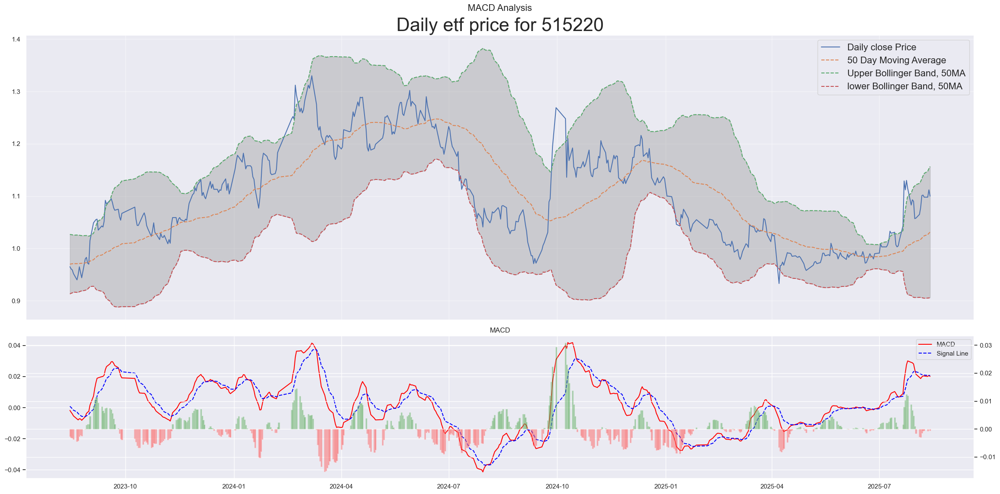

In [23]:
# 煤炭
etf_code = "515220"
etf_strategy(etf_code).output()

* Current etf price: 1.2
* Recent high: 1.24
* Current etf price is at 96.61% of recent high
Latest 20 Day MA: 1.2
Latest lower Bollinger Band, 20MA: 1.18
Latest higher Bollinger Band, 20MA: 1.22
Latest 50 Day MA: 1.2
Latest lower Bollinger Band, 50MA: 1.15
Latest higher Bollinger Band, 50MA: 1.24
Latest 50 Day EMA: 1.19
Latest 120 Day MA: 1.15
Latest 200 Day MA: 1.13
Latest 200 Day EMA: 1.13

Latest RSI: 40.96 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 1.05
20MA break point: 1.2
20MA lower Bollinger Band break point: 1.18
20MA Upper Bollinger Band break point: 1.23
50MA break point: 1.2
50MA lower Bollinger Band break point: 1.15
50MA Upper Bollinger Band break point: 1.24
120MA break point: 1.15
200MA break point: 1.13


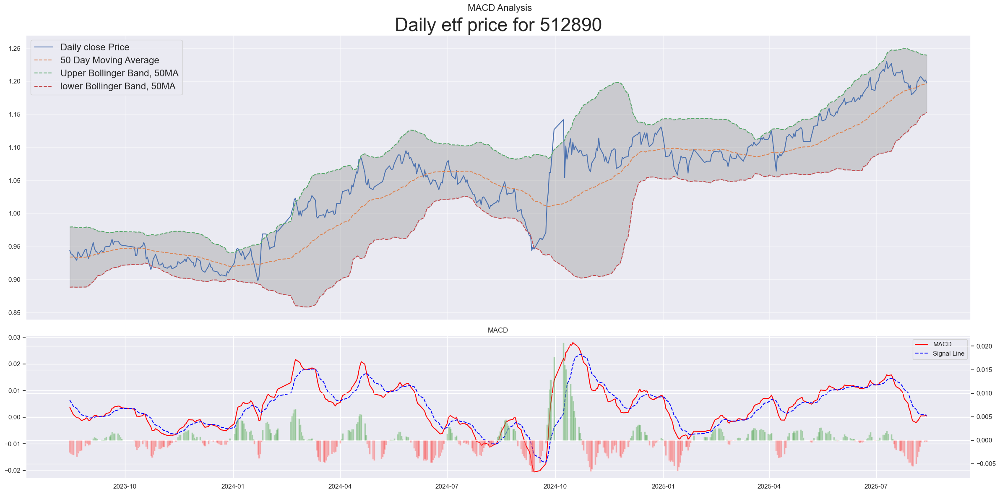

In [24]:
# 红利低波
etf_code = "512890"
etf_strategy(etf_code).output()

In [25]:
etf_code = "512890"
regression_start='20100101'
end=datetime.today().strftime('%Y%m%d')
detailed=False
adjust=""

df_etf = ak.fund_etf_hist_em(symbol=etf_code,
    	                   period="daily", 
                           start_date=regression_start,
                           end_date=end,
                           adjust=adjust)
df_etf.rename(columns={"日期": 'date', "开盘": 'open', "收盘": 'close', "最高": 'high', "最低": 'low', "成交量": 'volume', "成交额": 'amount'}, inplace=True)
df_etf['date'] = pd.to_datetime(df_etf['date'])
df_etf['max_price'] = df_etf['high'].cummax()
df_etf['drawdown'] = (df_etf['low'] - df_etf['max_price']) / df_etf['max_price']

max_drawdown_row = df_etf.loc[df_etf['drawdown'].idxmin()]
max_drawdown = max_drawdown_row['drawdown']

peak_date = df_etf.loc[:max_drawdown_row.name, 'high'].idxmax()
peak_price = round(df_etf.loc[peak_date, 'high'],2)
trough_date = max_drawdown_row['date']

df_etf = df_etf.reset_index()
df_etf['log_price'] = np.log(df_etf['close'])
df_etf

,index,date,open,close,high,low,volume,amount,振幅,涨跌幅,涨跌额,换手率,max_price,drawdown,log_price
0,0,2019-01-18,0.998,1.003,1.004,0.995,3244583,324300576.0,0.90,0.20,0.002,1.81,1.004,-0.008964,0.002996
1,1,2019-01-21,1.003,1.003,1.009,1.002,765523,77018053.0,0.70,0.00,0.000,0.43,1.009,-0.006938,0.002996
2,2,2019-01-22,1.004,1.000,1.006,0.999,150599,15106892.0,0.70,-0.30,-0.003,0.08,1.009,-0.009911,0.000000
3,3,2019-01-23,1.001,1.003,1.005,0.999,174368,17497300.0,0.60,0.30,0.003,0.10,1.009,-0.009911,0.002996
4,4,2019-01-24,1.004,1.006,1.008,1.002,310159,31218191.0,0.60,0.30,0.003,0.17,1.009,-0.006938,0.005982
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1587,1587,2025-08-07,1.201,1.206,1.206,1.196,2982263,358739093.0,0.83,0.42,0.005,1.66,1.798,-0.334816,0.187309
1588,1588,2025-08-08,1.205,1.207,1.210,1.204,2818922,340284017.0,0.50,0.08,0.001,1.57,1.798,-0.330367,0.188138
1589,1589,2025-08-11,1.207,1.200,1.209,1.196,6401540,767990005.0,1.08,-0.58,-0.007,3.57,1.798,-0.334816,0.182322
1590,1590,2025-08-12,1.198,1.202,1.208,1.197,2744768,330443606.0,0.92,0.17,0.002,1.53,1.798,-0.334260,0.183987


* Current etf price: 1.44
* Recent high: 1.56
* Current etf price is at 92.61% of recent high
Latest 20 Day MA: 1.43
Latest lower Bollinger Band, 20MA: 1.4
Latest higher Bollinger Band, 20MA: 1.47
Latest 50 Day MA: 1.4
Latest lower Bollinger Band, 50MA: 1.32
Latest higher Bollinger Band, 50MA: 1.48
Latest 50 Day EMA: 1.41
Latest 120 Day MA: 1.37
Latest 200 Day MA: 1.36
Latest 200 Day EMA: 1.36

Latest RSI: 49.02 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.44
20MA break point: 1.43
20MA lower Bollinger Band break point: 1.4
20MA Upper Bollinger Band break point: 1.47
50MA break point: 1.4
50MA lower Bollinger Band break point: 1.32
50MA Upper Bollinger Band break point: 1.49
120MA break point: 1.37
200MA break point: 1.36


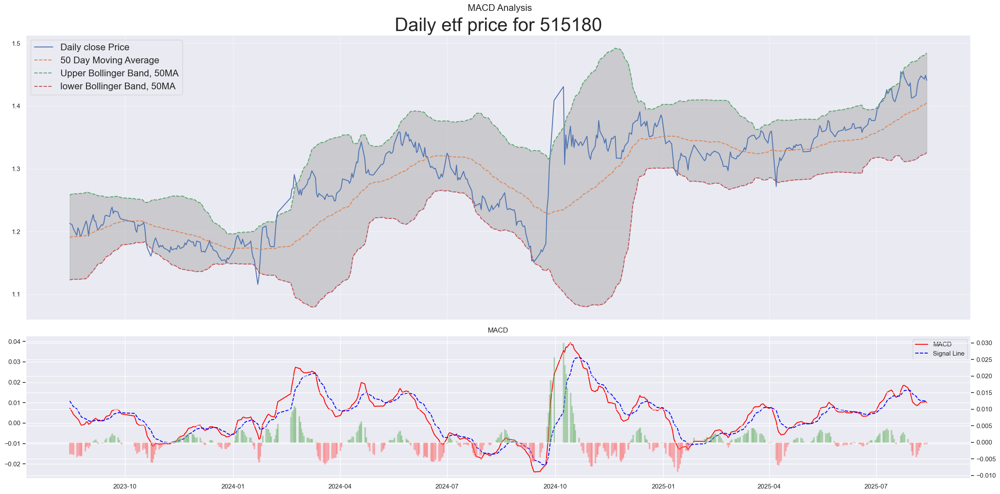

In [26]:
# 红利
etf_code = "515180"
etf_strategy(etf_code).output()

* Current commodity price: 273    775.3
Name: 现价, dtype: float64
* Recent high: 834.6
* Current commodity price is at 273    92.89
Name: 现价, dtype: float64% of recent high
Latest 20 Day MA: 775.28
Latest lower Bollinger Band, 20MA: 763.93
Latest higher Bollinger Band, 20MA: 786.64
Latest 50 Day MA: 775.07
Latest lower Bollinger Band, 50MA: 759.35
Latest higher Bollinger Band, 50MA: 790.79
Latest 50 Day EMA: 771.77
Latest 120 Day MA: 752.36
Latest 200 Day MA: 702.8
Latest 200 Day EMA: 710.2

Latest RSI: 35.61 
Latest MACD Divergence: 0.26 
20MA crosses 50MA at 760.5
20MA break point: 775.43
20MA lower Bollinger Band break point: 761.98
20MA Upper Bollinger Band break point: 788.88
50MA break point: 774.98
50MA lower Bollinger Band break point: 757.87
50MA Upper Bollinger Band break point: 792.09
120MA break point: 752.91
200MA break point: 703.2


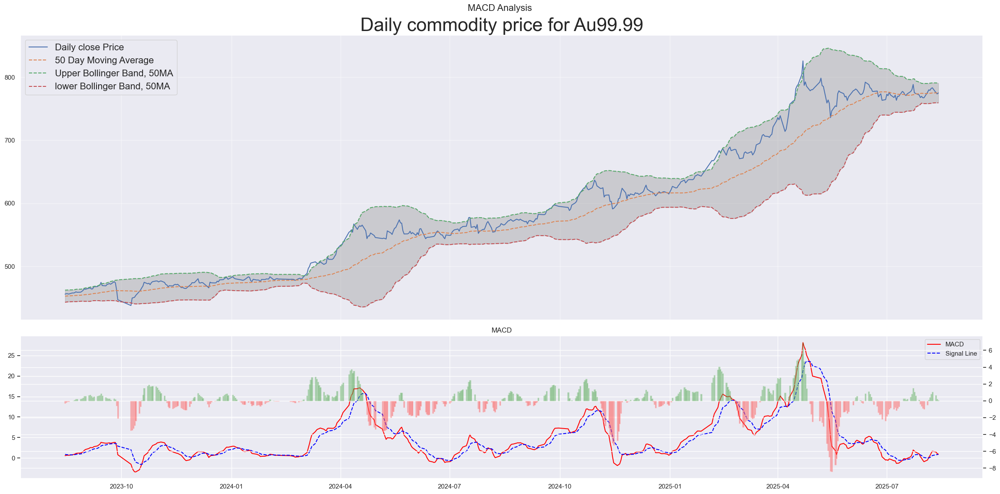

In [27]:
# 黄金
commodity_code = 'Au99.99'
commodity_strategy(commodity_code).output()

* Current etf price: 0.92
* Recent high: 0.94
* Current etf price is at 97.97% of recent high
Latest 20 Day MA: 0.89
Latest lower Bollinger Band, 20MA: 0.85
Latest higher Bollinger Band, 20MA: 0.92
Latest 50 Day MA: 0.86
Latest lower Bollinger Band, 50MA: 0.79
Latest higher Bollinger Band, 50MA: 0.93
Latest 50 Day EMA: 0.86
Latest 120 Day MA: 0.83
Latest 200 Day MA: 0.82
Latest 200 Day EMA: 0.81

Latest RSI: 78.21 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.02
20MA break point: 0.89
20MA lower Bollinger Band break point: 0.85
20MA Upper Bollinger Band break point: 0.92
50MA break point: 0.86
50MA lower Bollinger Band break point: 0.78
50MA Upper Bollinger Band break point: 0.94
120MA break point: 0.83
200MA break point: 0.82


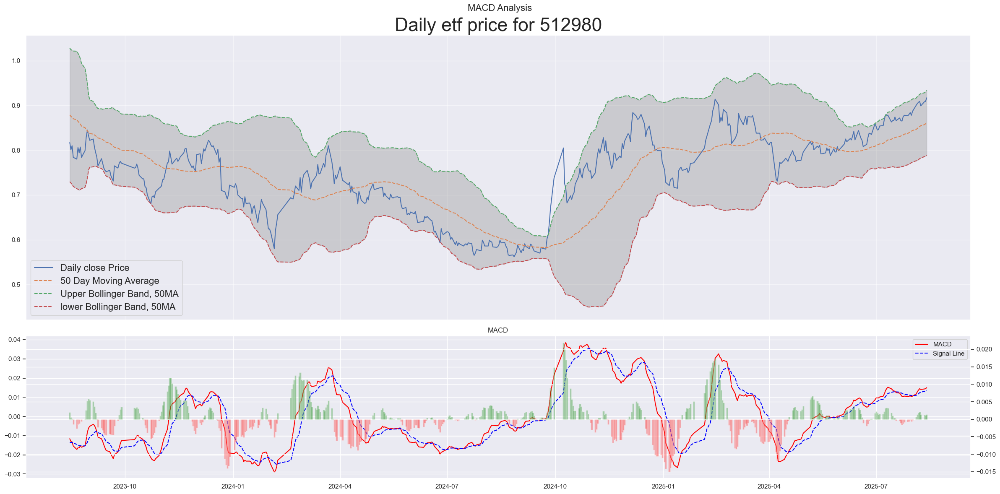

In [28]:
# 传媒
etf_code = "512980"
etf_strategy(etf_code).output()

* Current etf price: 1.3
* Recent high: 1.35
* Current etf price is at 96.3% of recent high
Latest 20 Day MA: 1.29
Latest lower Bollinger Band, 20MA: 1.27
Latest higher Bollinger Band, 20MA: 1.31
Latest 50 Day MA: 1.26
Latest lower Bollinger Band, 50MA: 1.16
Latest higher Bollinger Band, 50MA: 1.36
Latest 50 Day EMA: 1.26
Latest 120 Day MA: 1.19
Latest 200 Day MA: 1.18
Latest 200 Day EMA: 1.17

Latest RSI: 50.0 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.32
20MA break point: 1.29
20MA lower Bollinger Band break point: 1.27
20MA Upper Bollinger Band break point: 1.31
50MA break point: 1.26
50MA lower Bollinger Band break point: 1.16
50MA Upper Bollinger Band break point: 1.37
120MA break point: 1.19
200MA break point: 1.18


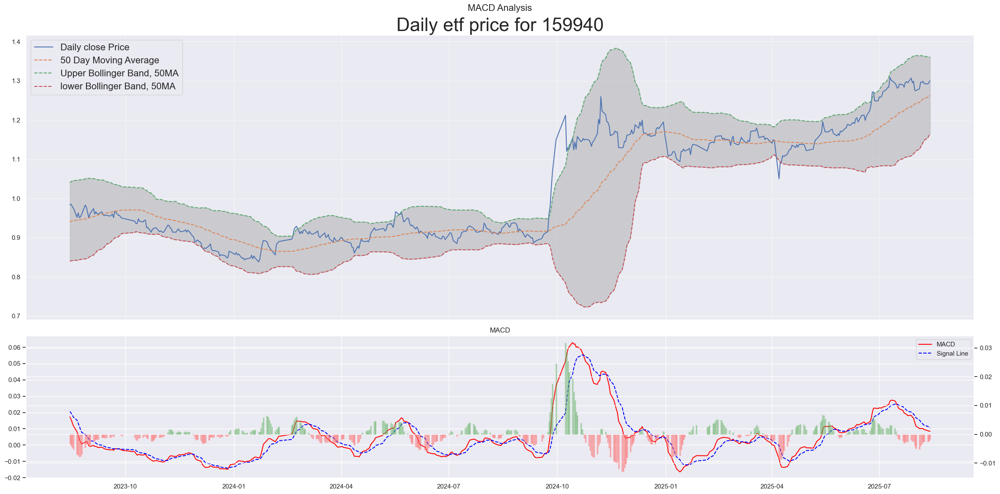

In [29]:
# 地产
etf_code = "159940"
etf_strategy(etf_code).output()

* Current etf price: 1.32
* Recent high: 1.42
* Current etf price is at 93.04% of recent high
Latest 20 Day MA: 1.3
Latest lower Bollinger Band, 20MA: 1.28
Latest higher Bollinger Band, 20MA: 1.33
Latest 50 Day MA: 1.29
Latest lower Bollinger Band, 50MA: 1.25
Latest higher Bollinger Band, 50MA: 1.33
Latest 50 Day EMA: 1.29
Latest 120 Day MA: 1.3
Latest 200 Day MA: 1.28
Latest 200 Day EMA: 1.26

Latest RSI: 54.62 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.92
50MA crosses 200MA at 0.83
20MA break point: 1.3
20MA lower Bollinger Band break point: 1.27
20MA Upper Bollinger Band break point: 1.33
50MA break point: 1.29
50MA lower Bollinger Band break point: 1.25
50MA Upper Bollinger Band break point: 1.33
120MA break point: 1.29
200MA break point: 1.28


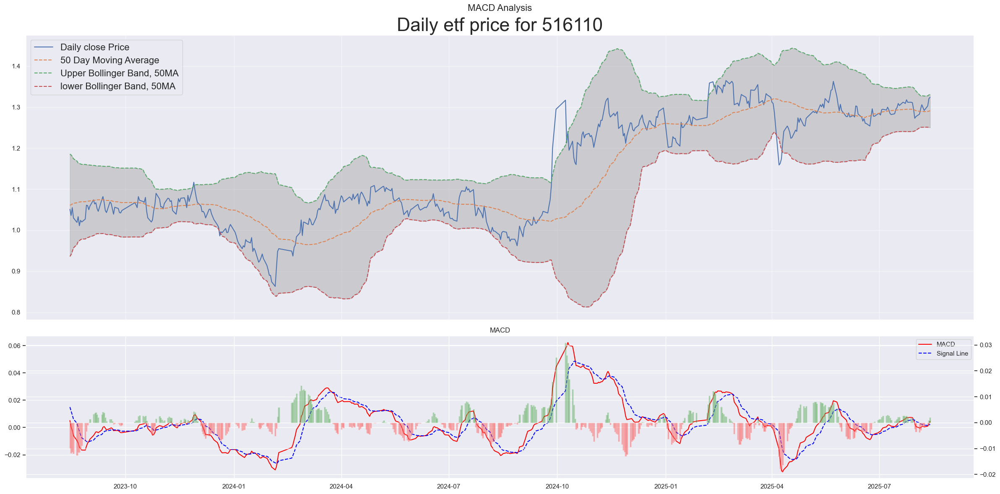

In [30]:
# 汽车
etf_code = "516110"
etf_strategy(etf_code).output()

* Current etf price: 1.44
* Recent high: 1.63
* Current etf price is at 88.69% of recent high
Latest 20 Day MA: 1.43
Latest lower Bollinger Band, 20MA: 1.38
Latest higher Bollinger Band, 20MA: 1.48
Latest 50 Day MA: 1.39
Latest lower Bollinger Band, 50MA: 1.29
Latest higher Bollinger Band, 50MA: 1.49
Latest 50 Day EMA: 1.4
Latest 120 Day MA: 1.4
Latest 200 Day MA: 1.32
Latest 200 Day EMA: 1.3

Latest RSI: 22.14 
Latest MACD Divergence: -0.01 
20MA crosses 50MA at 0.06
20MA break point: 1.43
20MA lower Bollinger Band break point: 1.38
20MA Upper Bollinger Band break point: 1.49
50MA break point: 1.39
50MA lower Bollinger Band break point: 1.28
50MA Upper Bollinger Band break point: 1.5
120MA break point: 1.4
200MA break point: 1.32


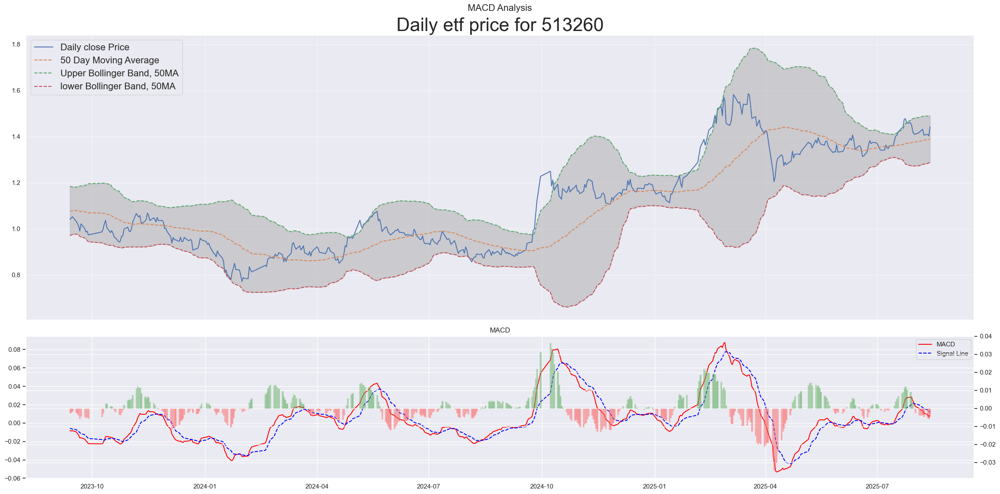

In [31]:
# 恒生科技
etf_code = "513260"
etf_strategy(etf_code).output()

* Current etf price: 0.7
* Recent high: 0.72
* Current etf price is at 96.67999999999999% of recent high
Latest 20 Day MA: 0.67
Latest lower Bollinger Band, 20MA: 0.62
Latest higher Bollinger Band, 20MA: 0.71
Latest 50 Day MA: 0.61
Latest lower Bollinger Band, 50MA: 0.48
Latest higher Bollinger Band, 50MA: 0.74
Latest 50 Day EMA: 0.61
Latest 120 Day MA: 0.53
Latest 200 Day MA: 0.47
Latest 200 Day EMA: 0.5

Latest RSI: 62.1 
Latest MACD Divergence: -0.0 
20MA break point: 0.67
20MA lower Bollinger Band break point: 0.63
20MA Upper Bollinger Band break point: 0.71
50MA break point: 0.61
50MA lower Bollinger Band break point: 0.47
50MA Upper Bollinger Band break point: 0.75
120MA break point: 0.53
200MA break point: 0.47


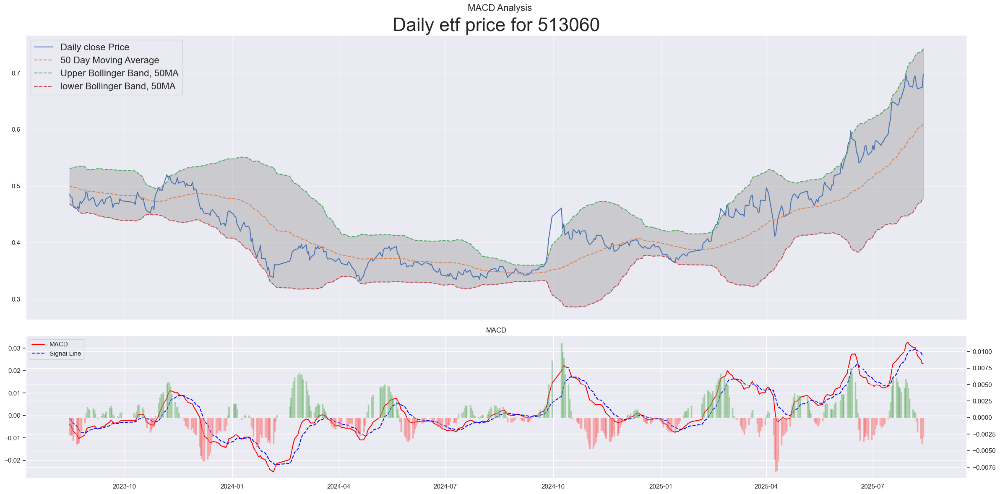

In [32]:
# 恒生医疗
etf_code = "513060"
etf_strategy(etf_code).output()

* Current etf price: 3.16
* Recent high: 3.17
* Current etf price is at 99.83999999999999% of recent high
Latest 20 Day MA: 3.09
Latest lower Bollinger Band, 20MA: 3.0
Latest higher Bollinger Band, 20MA: 3.17
Latest 50 Day MA: 3.0
Latest lower Bollinger Band, 50MA: 2.81
Latest higher Bollinger Band, 50MA: 3.2
Latest 50 Day EMA: 3.01
Latest 120 Day MA: 2.91
Latest 200 Day MA: 2.73
Latest 200 Day EMA: 2.75

Latest RSI: 41.7 
Latest MACD Divergence: -0.01 
20MA crosses 50MA at 0.4
20MA break point: 3.09
20MA lower Bollinger Band break point: 3.0
20MA Upper Bollinger Band break point: 3.18
50MA break point: 3.01
50MA lower Bollinger Band break point: 2.8
50MA Upper Bollinger Band break point: 3.21
120MA break point: 2.91
200MA break point: 2.73


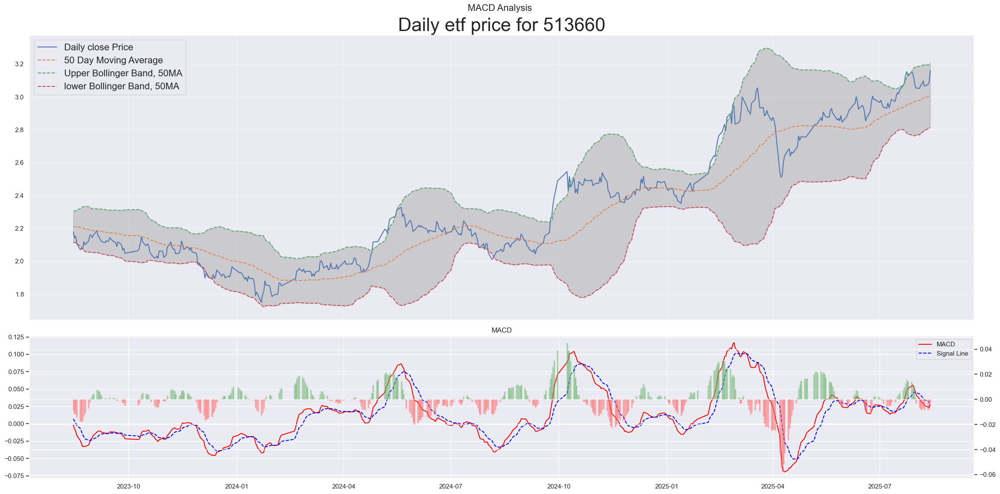

In [33]:
# 恒生
etf_code = "513660"
etf_strategy(etf_code).output()

* Current etf price: 1.47
* Recent high: 1.48
* Current etf price is at 99.53% of recent high
Latest 20 Day MA: 1.45
Latest lower Bollinger Band, 20MA: 1.41
Latest higher Bollinger Band, 20MA: 1.48
Latest 50 Day MA: 1.4
Latest lower Bollinger Band, 50MA: 1.27
Latest higher Bollinger Band, 50MA: 1.52
Latest 50 Day EMA: 1.4
Latest 120 Day MA: 1.3
Latest 200 Day MA: 1.24
Latest 200 Day EMA: 1.25

Latest RSI: 55.14 
Latest MACD Divergence: -0.0 
20MA break point: 1.45
20MA lower Bollinger Band break point: 1.41
20MA Upper Bollinger Band break point: 1.49
50MA break point: 1.4
50MA lower Bollinger Band break point: 1.27
50MA Upper Bollinger Band break point: 1.53
120MA break point: 1.3
200MA break point: 1.24


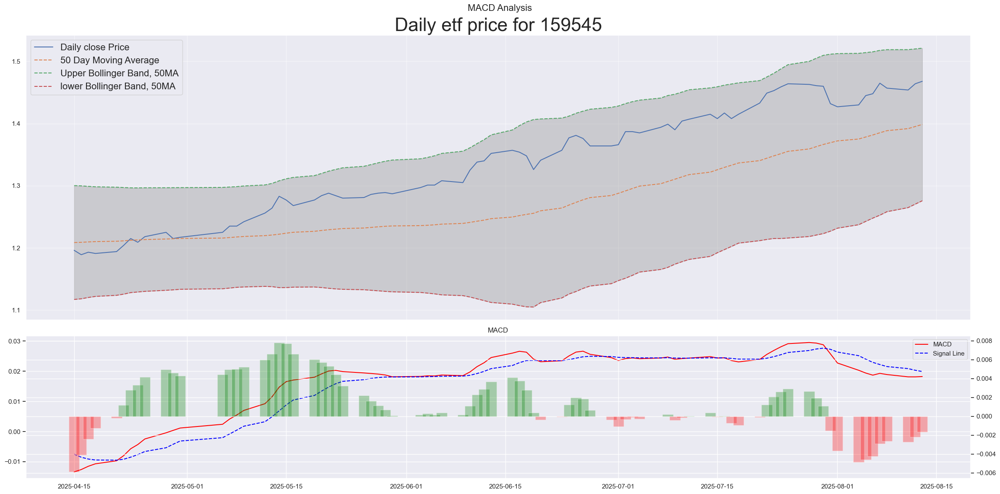

In [34]:
# 恒生红利低波
etf_code = "159545"
etf_strategy(etf_code).output()

* Current etf price: 2.94
* Recent high: 3.15
* Current etf price is at 93.47999999999999% of recent high
Latest 20 Day MA: 2.91
Latest lower Bollinger Band, 20MA: 2.86
Latest higher Bollinger Band, 20MA: 2.96
Latest 50 Day MA: 2.84
Latest lower Bollinger Band, 50MA: 2.67
Latest higher Bollinger Band, 50MA: 3.01
Latest 50 Day EMA: 2.85
Latest 120 Day MA: 2.78
Latest 200 Day MA: 2.75
Latest 200 Day EMA: 2.73

Latest RSI: 52.74 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.66
20MA break point: 2.91
20MA lower Bollinger Band break point: 2.86
20MA Upper Bollinger Band break point: 2.96
50MA break point: 2.84
50MA lower Bollinger Band break point: 2.66
50MA Upper Bollinger Band break point: 3.02
120MA break point: 2.78
200MA break point: 2.75


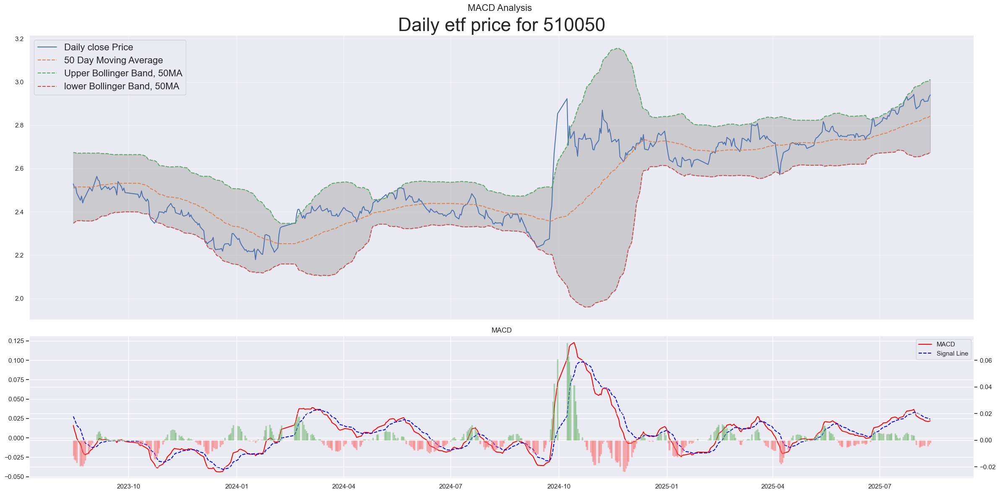

In [35]:
# 上证50
etf_code = "510050"
etf_strategy(etf_code).output()

In [36]:
def backtest_momentum_strategy(price_df, initial_cash=100_000, cycle=21, window=20, sell_early=False):
    """
    Backtest the momentum strategy with X-trading-day evaluation cycle.
    Returns:
        result_df: Daily portfolio value DataFrame
        actions_df: Log of only buy/sell actions
    """
    price_df = price_df.sort_index()
    
    # cycle-day moving average
    ma = price_df.rolling(window=window).mean()
    
    # cycle-day % change
    pct_change = price_df.pct_change(cycle)
    
    # Portfolio state
    cash = initial_cash
    shares = 0
    current_stock = None
    portfolio_values = []
    actions = []

    dates = price_df.index
    
    for i in range(cycle, len(dates)):  # start from the 22nd trading day
        date = dates[i]
        
        # Step (1): every cycle trading days, rebalance
        if (i - cycle) % cycle == 0:
            # Sell previous stock if any
            if current_stock is not None:
                sell_price = price_df.loc[date, current_stock]
                cash += shares * sell_price
                actions.append([date, "SELL", current_stock, sell_price, shares])
                shares = 0
                current_stock = None
            
            # Find candidates above ma
            candidates = [s for s in price_df.columns 
                          if price_df.loc[date, s] > ma.loc[date, s]]
            
            if candidates:
                # Pick stock with largest cycle-day % change
                stock_changes = pct_change.loc[date, candidates]
                pick = stock_changes.idxmax()
                buy_price = price_df.loc[date, pick]
                current_stock = pick
                shares = cash // buy_price
                cash -= shares * buy_price
                actions.append([date, "BUY", pick, buy_price, shares])
        
        # Step (2): sell early if price drops below ma
        if sell_early and current_stock is not None:
            if price_df.loc[date, current_stock] < ma.loc[date, current_stock]:
                sell_price = price_df.loc[date, current_stock]
                cash += shares * sell_price
                actions.append([date, "SELL_EARLY", current_stock, sell_price, shares])
                shares = 0
                current_stock = None
        
        # Record portfolio value
        if current_stock is not None:
            value = cash + shares * price_df.loc[date, current_stock]
        else:
            value = cash
        portfolio_values.append((date, value))
    
    # Create results DataFrames
    result_df = pd.DataFrame(portfolio_values, columns=["Date", "PortfolioValue"])
    result_df.set_index("Date", inplace=True)
    
    actions_df = pd.DataFrame(actions, columns=["Date", "Action", "Stock", "Price", "Shares"])
    actions_df.set_index("Date", inplace=True)
    
    total_days = len(result_df)
    final_value = result_df["PortfolioValue"].iloc[-1]
    annualized_return = (final_value / initial_cash) ** (252 / total_days) - 1
    
    return result_df, actions_df, annualized_return


def average_annualized_return(price_df, initial_cash=100_000, n_test=100, cycle=21, window=20):
    """
    Runs the strategy from different starting offsets (0-20) and averages annualized return.
    """
    returns = []
    for offset in range(n_test):  # 100 possible start offsets
        sliced_df = price_df.iloc[offset:].copy()
        if len(sliced_df) < 42:  # ensure enough data for lookback + holding
            continue
        _, _, ann_return = backtest_momentum_strategy(sliced_df, initial_cash, cycle=cycle, window=window)
        returns.append(ann_return)
    print(f"Average return: {np.mean(returns) if returns else np.nan}")
    print(f"Return STD: {np.std(returns) if returns else np.nan}")

    return returns

In [43]:
etf_list = [
"516570",
"512820",
"512260",
"512480",
"512580",
"159948",
"159819",
"512600",
"560880",
"512400",
"159697",
"515880",
"516080",
"159647",
"515220",
"512890",
"512980",
"159940",
"516110",
"513260",
"513060",
"513660",
# "159545", # history too short
"510050",
]
etf_code = etf_list[0]

df_all = ak.fund_etf_hist_em(
            symbol=etf_code.upper(),
            start_date=(datetime.today() - relativedelta(years=3)).strftime('%Y%m%d'),
            end_date=datetime.today().strftime('%Y%m%d'),
            period='daily',  # Default to daily,
            adjust='qfq'
)
df_all = df_all[['日期','收盘']].set_index('日期')
df_all = df_all.rename(columns={'收盘': etf_code})
for etf_code in etf_list[1:]:
    df = ak.fund_etf_hist_em(
            symbol=etf_code.upper(),
            start_date=(datetime.today() - relativedelta(years=3)).strftime('%Y%m%d'),
            end_date=datetime.today().strftime('%Y%m%d'),
            period='daily',  # Default to daily,
            adjust='qfq'
    )[['日期','收盘']].set_index('日期')
    df = df.rename(columns={'收盘': etf_code})
    df_all = pd.merge(df_all, df, left_index=True, right_index=True, how='inner')
df_all

,516570,512820,512260,512480,512580,159948,159819,512600,560880,512400,...,515220,512890,512980,159940,516110,513260,513060,513660,159545,510050
日期,,,,,,,,,,,,,,,,,,,,,
2024-04-15,0.785,0.999,1.479,0.676,0.944,1.932,0.719,0.721,1.171,1.119,...,1.280,1.063,0.703,0.878,1.089,0.893,0.349,1.971,0.909,2.403
2024-04-16,0.773,1.003,1.438,0.652,0.922,1.899,0.699,0.715,1.164,1.070,...,1.272,1.061,0.680,0.873,1.064,0.866,0.340,1.935,0.905,2.393
2024-04-17,0.783,1.022,1.480,0.681,0.940,1.935,0.726,0.719,1.189,1.093,...,1.289,1.082,0.708,0.887,1.086,0.865,0.342,1.932,0.910,2.418
2024-04-18,0.780,1.033,1.482,0.675,0.936,1.921,0.721,0.723,1.213,1.108,...,1.288,1.082,0.699,0.896,1.093,0.872,0.341,1.954,0.918,2.425
2024-04-19,0.792,1.031,1.479,0.654,0.915,1.892,0.700,0.717,1.206,1.101,...,1.289,1.084,0.688,0.891,1.089,0.851,0.332,1.933,0.916,2.409
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-08-07,0.779,1.533,1.651,1.097,0.974,2.579,1.072,0.695,1.471,1.281,...,1.102,1.206,0.909,1.299,1.299,1.432,0.681,3.097,1.465,2.921
2025-08-08,0.781,1.527,1.657,1.076,0.979,2.571,1.053,0.693,1.469,1.297,...,1.098,1.207,0.899,1.293,1.292,1.407,0.672,3.065,1.457,2.910
2025-08-11,0.789,1.514,1.668,1.084,0.993,2.618,1.072,0.700,1.481,1.305,...,1.098,1.200,0.908,1.292,1.303,1.410,0.674,3.076,1.454,2.912


In [44]:
result_df, actions_df, annualized_return = backtest_momentum_strategy(df_all, cycle=63, window=50)
print(annualized_return)
result_df

0.8508274033766106


,PortfolioValue
Date,
2024-07-17,100000.000
2024-07-18,99734.515
2024-07-19,99469.030
2024-07-22,97787.625
2024-07-23,98761.070
...,...
2025-08-07,168693.130
2025-08-08,168884.608
2025-08-11,172426.951


In [45]:
actions_df

,Action,Stock,Price,Shares
Date,,,,
2024-07-17,BUY,512820,1.130,88495.0
2024-10-23,SELL,512820,1.247,88495.0
2024-10-23,BUY,512480,0.976,113067.0
2025-01-21,SELL,512480,1.024,113067.0
2025-01-21,BUY,512480,1.024,113067.0
2025-04-29,SELL,512480,1.047,113067.0
2025-04-29,BUY,513060,0.484,244590.0
2025-07-31,SELL,513060,0.685,244590.0
2025-07-31,BUY,515880,1.750,95739.0
